In [2]:
import pandas as pd, numpy as np
from scipy.special import expit

class LogisticRegression:
    def __init__(self, learning_rate=0.0001, epsilon=0.000001): # put these hyperparameters into the fit function
        self.learning_rate = learning_rate
        #self.iterations = iterations
        self.epsilon = epsilon
        self.weights = None
        self.bias = None
  
  #takes data set X and true value set Y, generates weights using classes learning rate and epsilon
    def fit(self, X, y):
        # init parameters
        samples, features = X.shape
        #self.weights =  np.random.random_sample(size = features) #accuracy got worse with rnd start weights, which is odd
        self.weights = np.zeros(features)
        self.bias = 0

        c = 0
        # gradient descent
        lr = self.learning_rate
        alpha_dec = 1000
        while True:
            c+=1
            oldWeights = self.weights.copy()
            linear_model = np.dot(X, self.weights) + self.bias
            y_predicted = self._sigmoid(linear_model)

            dw = (1/samples) * np.dot(X.T, (y_predicted - y))
            db = (1/samples) * np.sum(y_predicted - y)

            self.weights -= lr * dw
            self.bias -= lr * db 
            delta = np.subtract(self.weights, oldWeights)
            if(delta.dot(delta) < self.epsilon): #or c>10000):
                # print("iterations: ", c)
                # print("learning rate: ", lr)
                break
            if(c>alpha_dec):
                alpha_dec+=750
                lr = max(lr*0.9,2*self.epsilon) #slowly decrement learning rate as we iterate, always greater than epsilon
    
  #given data X, predict the output class
    def predict(self, X):
        linear_model = np.dot(X, self.weights) + self.bias
        y_predicted = self._sigmoid(linear_model)
        y_predicted_cls = [1 if i > 0.5 else 0 for i in y_predicted]
        return y_predicted_cls

    def _sigmoid(self, x):
        return expit(x) #needed this because data was too large, it does the exact same thing as commented function
        #return 1 / (1 + np.exp(-x)) fails for stock, overflow

#given a dataframe and array of ratios (sum to one), return a dataframe split via randomized mask selection
def partition(data, sizes, seed=0):
    #theoretically the randomness serves to shuffle, so we don't need to do that
    out=[]
    d = data
    np.random.seed(seed)
    amtLeft = 1
    for i in sizes:
        mask = np.random.rand(len(d))<(i/amtLeft)
        # print(len(d[mask]))
        out.append(d[mask])
        d = d[~mask]
        amtLeft -=i
    out.append(d)
    # print(len(d))
    return out

#returns the accuracy of the predictions
def accu_eval(y_true, y_pred):
    accuracy = np.sum(y_true == y_pred) / len(y_true)
    return accuracy
  
#given a dataframe and number of folds, splits the data into k partitions and perfoms k-fold over them returning the avg_error of the model
def k_fold(df, k=10, learning_rate=0.0001,epsilon=0.00000001, seed=0):
    partitions = partition(df,[1/k]*(k-1),seed=seed)
    err = 0
    for i in range(k):
    #print("i is: ", i )
        temp_df = pd.concat(partitions[:i]+partitions[i+1:])
        # print("train df size: ", temp_df.shape)
        # print("test df size:  ", partitions[i].shape)
        X_test = partitions[i][df.columns[1:]]
        X_train = temp_df[df.columns[1:]]
        y_test = partitions[i]["Class Label"]
        y_train = temp_df["Class Label"]
    
        model = LogisticRegression(learning_rate=learning_rate, epsilon=epsilon) 
        model.fit(X_train,y_train)  
        # print("accuracy: ", accu_eval(y_test,model.predict(X_test)))
        err+=accu_eval(y_test,model.predict(X_test))
    return (k-err)/k

if __name__ == '__main__':
    df = pd.read_csv('Parkinson.csv')
    df_stock = pd.read_csv('Stock.csv')

    #split up all the discrete 0-3 data into binary columns
    preproc_df = pd.get_dummies(df, columns = ['18. Speech', '19. Facial Expression',
       '20. Tremor at Rest - head', '20. Tremor at Rest - RUE',
       '20. Tremor at Rest - LUE', '20. Tremor at Rest - RLE',
       '20. Tremor at Rest - LLE', '21. Action or Postural Tremor - RUE',
       '21. Action or Postural Tremor - LUE', '22. Rigidity - neck',
       '22. Rigidity - RUE', '22. Rigidity - LUE', '22. Rigidity - RLE',
       '22. Rigidity - LLE', '23.Finger Taps - RUE', '23.Finger Taps - LUE',
       '24. Hand Movements  - RUE', '24. Hand Movements  - LUE',
       '25. Rapid Alternating Movements - RUE',
       '25. Rapid Alternating Movements -  LUE', '26. Leg Agility - RLE',
       '26. Leg Agility - LLE', '27.  Arising from Chair ', '28. Posture',
       '29. Gait', '30. Postural Stability',
       '31. Body Bradykinesia and Hypokinesia'])
    #normalize the data by column
    normalized_pp_df=(preproc_df-preproc_df.min())/(preproc_df.max()-preproc_df.min())

    #replace NaNs (zeroes) with the column mean
    df_stock[df_stock.columns[1:]] = df_stock[df_stock.columns[1:]].replace(0,df_stock.mean(axis=0))

    #normalize the data
    normalized_stock_df=(df_stock-df_stock.min())/(df_stock.max()-df_stock.min())

    normalized_nopp_df = (df-df.min())/(df.max()-df.min())

    #current bes
    parkinson_df_norm_badcolsdropped = normalized_nopp_df.drop(columns=['19. Facial Expression',
       '20. Tremor at Rest - head', '20. Tremor at Rest - RUE',
       '20. Tremor at Rest - LLE', '21. Action or Postural Tremor - LUE', '22. Rigidity - neck',
       '22. Rigidity - LUE', '22. Rigidity - RLE',
       '23.Finger Taps - RUE', '23.Finger Taps - LUE',
       '24. Hand Movements  - RUE', '24. Hand Movements  - LUE',
       '25. Rapid Alternating Movements - RUE',
       '25. Rapid Alternating Movements -  LUE', '26. Leg Agility - RLE',
       '26. Leg Agility - LLE','29. Gait',
       '31. Body Bradykinesia and Hypokinesia',
       'Decay of unvoiced fricatives              (promile/min)',
       'Latency of\nrespiratory exchange (ms)',
       'Entropy of speech timing (-).1',
       'Decay of unvoiced fricatives              (?/min)',
       'Relative loudness of respiration (dB).1',
       'Pause intervals per respiration (-).1',
       'Latency of\nrespiratory exchange (ms).1'])

    #print(k_fold(parkinson_df_norm_badcolsdropped, k=10, learning_rate=0.1, epsilon=0.000001, seed=0))
    good_columns = np.asarray(["Class Label",'Rate of speech timing (-/min).1',
       'Duration of pause intervals (ms)',
       'Gaping                          in-between voiced\nintervals  (-/min)',
       'Relative loudness of respiration (dB)',
       'Medication - Clonazepam (mg/day)', 'UPDRS III total (-)',
       'Acceleration of speech timing (-/min2)',
       'Duration of voiced intervals (ms)',
       'Rate of speech timing (-/min)',
       'Decay of unvoiced fricatives              (?/min)',
       'Latency of\nrespiratory exchange (ms).1',
       '20. Tremor at Rest - LUE_2', '19. Facial Expression_2',
       'Entropy of speech timing (-)', '23.Finger Taps - RUE_2'])

  
  #print(k_fold(helen_df, k=10, learning_rate=0.1, epsilon=0.000001, seed=0))
    outdf = normalized_stock_df
    sigcols = ['ASTL_turnover', 'MEBL_turnover', 'SMCPL_turnover', 'OGDC_turnover', 'SERF_turnover', 'QUET_turnover', 'BERG_turnover', 'EPCL_turnover', 'AMBL_turnover', 'GATM_turnover', 'UBL_turnover', 'CPPL_turnover', 'JPGL_turnover', 'JSML_turnover', 'SRSM_turnover', 'JSCL_turnover', 'NPL_turnover', 'FFLNV_turnover', 'YOUW_turnover']
    for c in normalized_stock_df.columns:
        '''
        if(c.endswith("_close")):
          s = c[:-6]
          k = s+"_delta"
          kwargs = {k: normalized_stock_df[s+"_close"]-normalized_stock_df[s+"_open"]}
          outdf = outdf.assign(**kwargs)
        '''
        if(c.endswith("_average")):
            s = c[:-8]
            k = s+"_pow0.1"
            kwargs = {k: normalized_stock_df[s+"_average"]**0.1}
            outdf = outdf.assign(**kwargs)
        if(c in sigcols):
            k = c+"_pow1.5"
            kwargs = {k: normalized_stock_df[c]**1.5}
            outdf = outdf.assign(**kwargs)
    print(k_fold(outdf, k=10, learning_rate=0.1, epsilon=0.000001, seed=0))
    #print("good columns only")
    #print(k_fold(normalized_pp_df[[c for c in normalized_pp_df.columns if c in good_columns]], k=10,learning_rate=0.1,epsilon=0.00001, seed=0))
    #display(normalized_pp_df[[c for c in normalized_pp_df.columns if c in good_columns]])

    #print(k_fold(normalized_pp_df, k=10, learning_rate=0.1, epsilon=0.000001, seed=0))

0.1677979844082051


# Data Exploration for Parkinson dataset

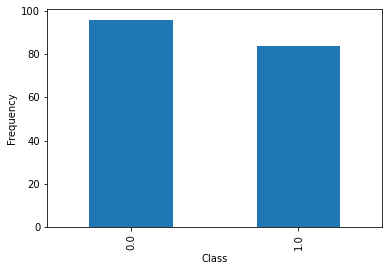

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv('Parkinson.csv')
df_stock = pd.read_csv('Stock.csv')

normalized_pp_df['Class Label'].value_counts().plot(kind='bar')
plt.xlabel("Class")
plt.ylabel("Frequency")
plt.savefig('Figure_1.png')

In [8]:
df.info

<bound method DataFrame.info of      Class Label  Age (years)  Gender  \
0              0           84       1   
1              0           44       1   
2              0           91       0   
3              1           40       0   
4              1           23       0   
..           ...          ...     ...   
175            1           53       0   
176            0           69       0   
177            0           45       0   
178            0           27       0   
179            0           63       0   

     Medication - Levodopa equivalent (mg/day)  \
0                                     0.517898   
1                                     0.407540   
2                                     0.404558   
3                                     0.881327   
4                                     0.067584   
..                                         ...   
175                                   0.221518   
176                                   0.271347   
177                      

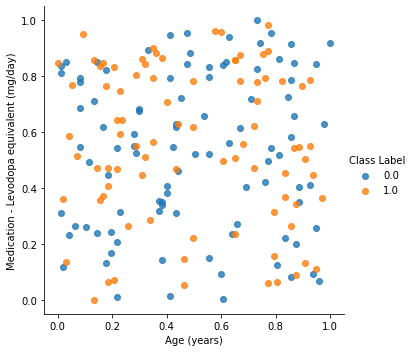

In [4]:
sns.lmplot('Age (years)', 'Medication - Levodopa equivalent (mg/day)', normalized_pp_df, hue='Class Label', fit_reg=False)
fig = plt.gcf()
# fig.set_size_inches(15, 10)
plt.show()

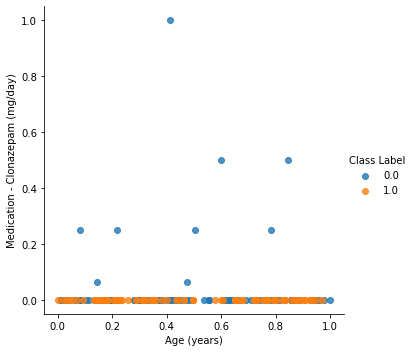

In [5]:
sns.lmplot('Age (years)', 'Medication - Clonazepam (mg/day)', normalized_pp_df, hue='Class Label', fit_reg=False)
fig = plt.gcf()
# fig.set_size_inches(15, 10)
plt.show()

In [ ]:
# sns.pairplot(df_data)

/shared-libs/python3.7/py/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


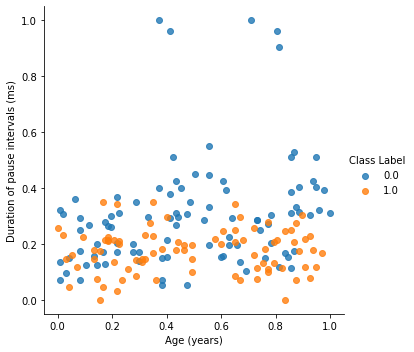

In [ ]:
plot = sns.lmplot('Age (years)', 'Duration of pause intervals (ms)', normalized_pp_df, hue='Class Label', fit_reg=False)
fig = plt.gcf()
# fig.set_size_inches(15, 10)
plt.show()

/shared-libs/python3.7/py/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


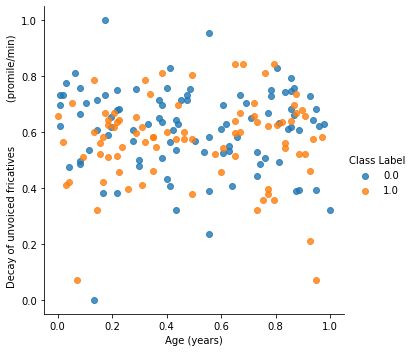

<Figure size 432x288 with 0 Axes>

In [ ]:
sns.lmplot('Age (years)', 'Decay of unvoiced fricatives              (promile/min)', normalized_pp_df, hue='Class Label', fit_reg=False)
fig = plt.gcf()
plt.show()

/shared-libs/python3.7/py/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


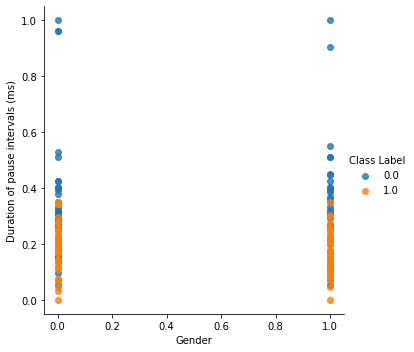

In [ ]:
sns.lmplot('Gender', 'Duration of pause intervals (ms)', normalized_pp_df, hue='Class Label', fit_reg=False)
fig = plt.gcf()
# fig.set_size_inches(15, 10)
plt.show()

AttributeError: 'AxesSubplot' object has no attribute 'savefig'

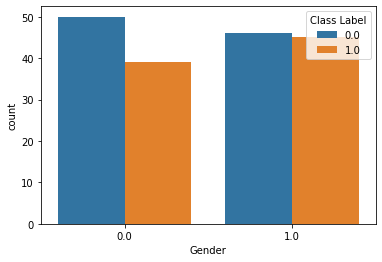

In [ ]:
bar = sns.countplot(x="Gender", hue="Class Label", data=normalized_pp_df)
plt.show()
# bar.savefig('Figure_3.png')

# Data Exploration for Stocks dataset

In [ ]:
df_stock.shape

(4902, 155)

In [ ]:
df_stock.columns

Index(['Class Label', 'ASTL_average', 'ASTL_high', 'ASTL_low', 'ASTL_close',
       'ASTL_open', 'ASTL_ldcp', 'ASTL_turnover', 'ITTEFAQ_average',
       'ITTEFAQ_high',
       ...
       'NPL_open', 'NPL_ldcp', 'NPL_turnover', 'YOUW_average', 'YOUW_high',
       'YOUW_low', 'YOUW_close', 'YOUW_open', 'YOUW_ldcp', 'YOUW_turnover'],
      dtype='object', length=155)

In [ ]:
df_stock.head()

,Class Label,ASTL_average,ASTL_high,ASTL_low,ASTL_close,ASTL_open,ASTL_ldcp,ASTL_turnover,ITTEFAQ_average,ITTEFAQ_high,...,NPL_open,NPL_ldcp,NPL_turnover,YOUW_average,YOUW_high,YOUW_low,YOUW_close,YOUW_open,YOUW_ldcp,YOUW_turnover
0,0,103.859064,82.093673,105.841696,97.417805,149.248953,35.325280,124834.93440,150.973260,176.094779,...,70.989127,61.109608,172987.1434,69.345315,116.076030,85.815500,48.475333,118.332487,88.058695,131181.1646
1,1,110.390978,88.055415,94.668356,176.951512,92.543613,179.384246,147801.66640,26.641067,172.267066,...,27.862758,79.134976,118726.9040,167.904677,118.346120,174.663367,150.898050,49.924037,50.573158,130751.5489
2,0,164.178287,70.831153,35.503829,47.845112,156.080739,67.894139,207147.22270,35.338364,106.008802,...,143.883858,25.895315,264023.3588,112.579108,102.696577,95.060587,31.772834,163.536032,162.756074,279417.4532
3,0,90.082154,34.715383,41.214010,91.641368,174.813789,162.001915,275016.08020,106.695919,50.648256,...,176.397525,114.485159,152672.5519,131.702494,174.302833,90.363650,111.698225,107.401190,162.423947,274485.2593
4,0,66.605124,111.008552,83.858507,82.640081,49.943619,55.108362,65947.34696,29.901753,119.686153,...,99.847295,116.029991,216625.3467,133.764294,158.245103,110.636810,133.380671,142.255291,150.094634,95968.2895


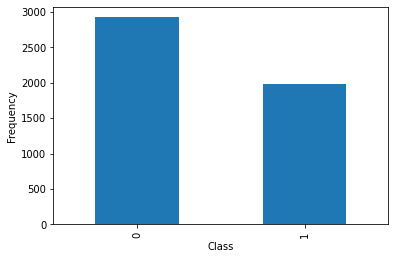

In [6]:

df_stock['Class Label'].value_counts().plot(kind='bar')
plt.xlabel("Class")
plt.ylabel("Frequency")
plt.savefig('Figure_3.png')

In [8]:
df_stock.describe()

,Class Label,ASTL_average,ASTL_high,ASTL_low,ASTL_close,ASTL_open,ASTL_ldcp,ASTL_turnover,ITTEFAQ_average,ITTEFAQ_high,...,NPL_open,NPL_ldcp,NPL_turnover,YOUW_average,YOUW_high,YOUW_low,YOUW_close,YOUW_open,YOUW_ldcp,YOUW_turnover
count,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,...,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000,4902.000000
mean,0.403305,104.090686,102.373501,103.137260,103.731487,103.725093,103.385148,155230.124195,103.282926,102.793066,...,103.013058,102.713818,155575.571748,102.066001,103.430409,103.187437,104.252564,103.425390,102.923609,156309.606763
std,0.490611,44.630701,44.192798,44.324705,43.753304,44.144685,44.279623,76821.481099,44.513305,44.527254,...,44.798235,44.017453,77519.560158,44.866966,44.102673,44.367499,44.406910,44.013939,44.143646,76436.425143
min,0.000000,25.617357,25.649535,25.646468,25.604801,25.657966,25.625567,20024.560450,25.707917,25.629977,...,25.693608,25.618761,20000.048630,25.609975,25.624481,25.610042,25.632236,25.668514,25.663431,20044.329660
25%,0.000000,65.821062,64.350029,65.592857,66.788113,65.387541,65.860738,89050.218580,65.107392,64.367741,...,63.976454,65.157748,89115.819127,62.785936,65.395718,65.780409,66.230710,65.959893,65.247899,91699.247318
50%,0.000000,104.407386,101.319382,102.818644,102.728097,103.885941,102.555527,152416.119400,102.251407,101.748212,...,101.253948,100.902432,154350.925200,101.348904,102.427447,101.124514,103.168839,102.721368,101.638100,155425.427600
75%,1.000000,142.798906,140.446193,140.883113,140.743682,141.573635,141.533046,220746.241750,141.627302,141.485284,...,142.806103,140.456174,221997.195300,141.185439,141.338065,141.645738,142.235318,140.611428,141.106103,221516.293425
max,1.000000,180.384350,180.495630,180.469189,180.468531,180.494339,180.477006,289978.056600,180.487205,180.476551,...,180.391788,180.499297,289969.393600,180.456037,180.490121,180.444683,180.486666,180.472416,180.451004,289935.248500


In [7]:
df_stock.info

<bound method DataFrame.info of       Class Label  ASTL_average   ASTL_high    ASTL_low  ASTL_close  \
0               0    103.859064   82.093673  105.841696   97.417805   
1               1    110.390978   88.055415   94.668356  176.951512   
2               0    164.178287   70.831153   35.503829   47.845112   
3               0     90.082154   34.715383   41.214010   91.641368   
4               0     66.605124  111.008552   83.858507   82.640081   
...           ...           ...         ...         ...         ...   
4897            1    110.917260   25.877565  127.695497   37.524615   
4898            0    136.637314   87.979033   39.452755  111.752887   
4899            1    143.601465  109.451639  132.687340  126.329908   
4900            1    138.643327  103.134235   89.935634  109.741174   
4901            1    152.483975  176.659364   63.805057  144.437126   

       ASTL_open   ASTL_ldcp  ASTL_turnover  ITTEFAQ_average  ITTEFAQ_high  \
0     149.248953   35.325280   124834

/shared-libs/python3.7/py/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


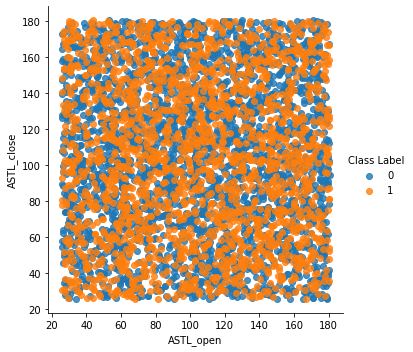

In [62]:
sns.lmplot('ASTL_open', 'ASTL_close', df_stock, hue='Class Label', fit_reg=False)
fig = plt.gcf()
plt.show()

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=af145c1c-14b6-4e6f-9cb0-95cfccb6ca7d' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>